In [1]:
import os, sys

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

import contextily as cx
import pickle

import IR_processing_utils
import IR_corrections

from tqdm import tqdm

import scipy.signal

plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 7


In [2]:
#data_dir = r'G:\! Data\IFA\! campaigns\202404 Pleistocene Park\IR_mavic3\DJI_202404210937_006_Pleystocen-IR'; flight_height = 160
#data_dir = r"G:\! Data\IFA\! campaigns\202404 Pleistocene Park\IR_mavic3\DJI_202404211121_009_Pleystocen-IRb"; flight_height = 160

#data_dir = r"G:\! Data\IFA\! campaigns\202404 Pleistocene Park\IR_mavic3\DJI_202404221041_013_Pleystocen-IR4"; flight_height = 400

#data_dir = r'G:\! Data\IFA\! campaigns\202404 Pleistocene Park\IR_mavic3\DJI_202404221002_011_Pleystocen-IR3'; flight_height = 220
#data_dir = r'G:\! Data\IFA\! campaigns\202404 Pleistocene Park\IR_mavic3\DJI_202404221218_016_Pleystocen-IR3b'; flight_height = 220
#data_dir = r'G:\! Data\IFA\! campaigns\202404 Pleistocene Park\IR_mavic3\DJI_202404230843_017_Pleystocen-IR5'; flight_height = 230

#data_dir = r'G:\! Data\IFA\! campaigns\202404 Pleistocene Park\IR_mavic3\DJI_202404231239_024_Pleystocen-IR3'; flight_height = 220

data_dir = r"G:\! Data\IFA\! campaigns\292406 Mukhrino\IR processing\DJI_202406041941_049_muhrino-big-2"; flight_height = 150

#data_subdir = 'tiffs_thermal_parser, emis = 1.00'
data_subdir = None

sensor_size = [6.144, 7.68] #Mavic sensor size in mm

corr_opts = {'detrend': True, 
             'L2_wnd': 9, 'L2_nsteps': 3,
             'L3_wnd': 9, 'L3_nsteps': 5}

#***************************************************************************************************

if data_subdir is not None:
    data_dir_src = data_dir + '/' + data_subdir + '/'
else:
    data_dir_src = data_dir + '/'

display(data_dir_src)

img_array={}

img_array['raw'], img_df = IR_processing_utils.read_IR_images (data_dir_src, n_jobs = 4)

img_shape = img_array['raw'].shape
img_N = img_df.shape[0]

# gps_az = np.zeros_like (img_df.gps_lon)
# for i in range (0, img_df.shape[0]-1):
#     gps_az[i] = IR_processing_utils.calc_compass_bearing ((img_df.gps_lat[i],img_df.gps_lon[i]), (img_df.gps_lat[i+1],img_df.gps_lon[i+1]))
# gps_az[-1] = gps_az[-2]
# img_df['gps_azimuth'] = gps_az

img_df = IR_processing_utils.calc_azimuth4df (img_df)
img_df = IR_processing_utils.init_polygons4df (img_df, sensor_size, flight_height)

display(img_df.head())

pics_dir = data_dir_src + '/processing_pics/'
if not os.path.isdir (pics_dir):
    os.mkdir (pics_dir)




'G:\\! Data\\IFA\\! campaigns\\292406 Mukhrino\\IR processing\\DJI_202406041941_049_muhrino-big-2/'

,file,gps_lat,gps_lon,Image ImageWidth,Image ImageLength,Image BitsPerSample,Image Compression,Image PhotometricInterpretation,Image ImageDescription,Image Make,...,Interoperability Tag 0x41CE,Interoperability Tag 0x41C6,gps_azimuth,min_lon,max_lon,min_lat,max_lat,delta_lon,delta_lat,Polygon
0,DJI_20240604194357_0001_T.tiff,60.892688,68.681460,640.0,512.0,32.0,1.0,1.0,IronRed,DJI,...,NaN,NaN,179.789590,68.680295,68.682626,60.892234,60.893143,0.002332,0.000909,POLYGON ((68.68262639047884 60.893142632345715...
1,DJI_20240604194359_0002_T.tiff,60.892640,68.681461,640.0,512.0,32.0,1.0,1.0,IronRed,DJI,...,NaN,NaN,180.093966,68.680295,68.682627,60.892186,60.893095,0.002332,0.000909,"POLYGON ((68.68262674984445 60.89309479901564,..."
2,DJI_20240604194401_0003_T.tiff,60.892492,68.681460,640.0,512.0,32.0,1.0,1.0,IronRed,DJI,...,NaN,NaN,180.069040,68.680294,68.682626,60.892038,60.892946,0.002332,0.000909,POLYGON ((68.68262624443258 60.892946493470205...
3,DJI_20240604194403_0004_T.tiff,60.892301,68.681460,640.0,512.0,32.0,1.0,1.0,IronRed,DJI,...,NaN,NaN,179.862557,68.680294,68.682626,60.891847,60.892756,0.002332,0.000909,"POLYGON ((68.68262576525379 60.89275585459433,..."
4,DJI_20240604194406_0005_T.tiff,60.892116,68.681461,640.0,512.0,32.0,1.0,1.0,IronRed,DJI,...,NaN,NaN,180.156853,68.680295,68.682627,60.891661,60.892570,0.002332,0.000909,"POLYGON ((68.6826266751373 60.892569965718124,..."


In [3]:

#IR_processing_utils.preview_photos (img_array['raw'], img_df, range(10,30), pics_dir + '/preview/')

    

In [4]:
diff_matrix = {}

reload_pkl = False
pkl_path = data_dir_src + '/diff_matrix, h = %d'%flight_height + '.pkl'

if not os.path.isfile (pkl_path):
    reload_pkl = True
if reload_pkl:
    diff_matrix['raw'], diff_weights = IR_processing_utils.calc_diff_matrix (img_array['raw'], img_df)

    with open(pkl_path, 'wb') as handle:
        pickle.dump((diff_matrix['raw'], diff_weights), handle, protocol=pickle.HIGHEST_PROTOCOL) 
else:
    with open(pkl_path, 'rb') as handle:
        diff_matrix['raw'], diff_weights = pickle.load(handle)




'n_outliers = 4, max_diff = 7.447801'

'n_outliers = 3, max_diff = 1.074472'

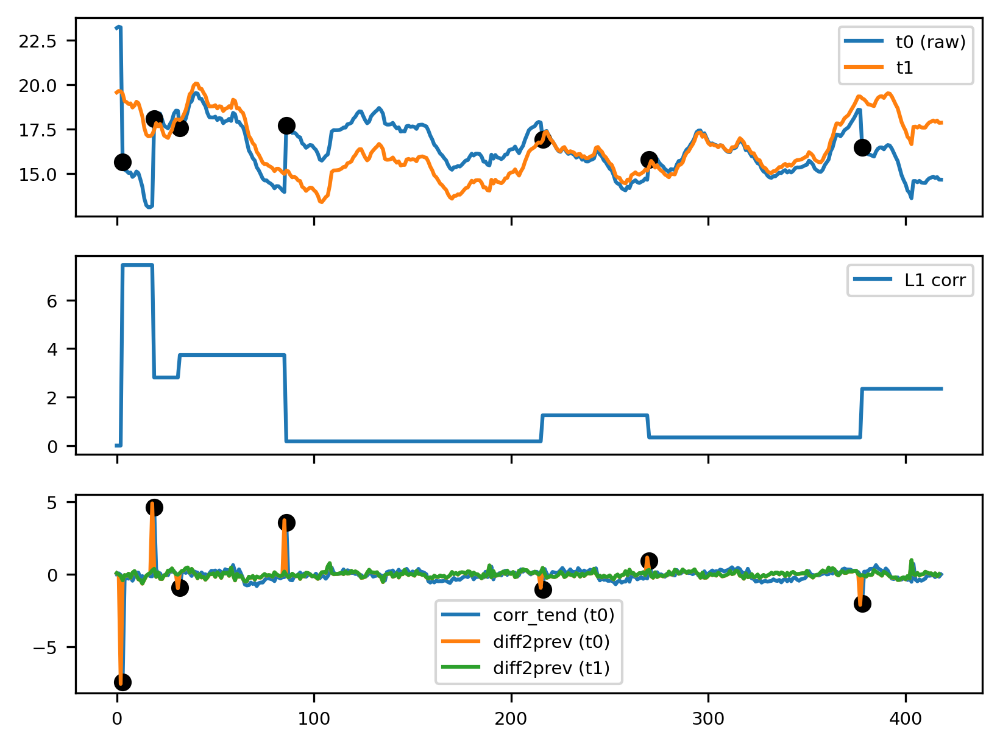

In [5]:
save_dir = pics_dir + '/corr_new/'
if not os.path.isdir (save_dir):
    os.mkdir (save_dir)


img_array['t1'], diff_matrix['t1'] = IR_corrections.run_L1_corr (img_array['raw'], diff_matrix['raw'],
                                                                 corr_opts['detrend'], pics_dir = save_dir)


In [6]:
#import scipy.signal
# corr_tend1  = np.array([diff_matrix['t1'][i, i-1] if i > 0 else 0 for i in range (0, img_N)])
# corr_tend31 = np.array([diff_matrix['t31'][i, i-1] if i > 0 else 0 for i in range (0, img_N)])

# f, ax = plt.subplots(3,1)
# ax[0].plot(np.cos((np.pi/180)*img_df['gps_azimuth']))
# ax[1].plot(corr_tend1)
# ax[1].plot(corr_tend31)


# ax[2].plot(np.cumsum(corr_tend1))# -np.mean(corr_tend1))) #-np.mean(corr_tend)))
# ax[2].plot(np.cumsum(corr_tend31))# -np.mean(corr_tend31)))
# # ax[2].plot(scipy.signal.detrend (np.cumsum(corr_tend)))

# idx = np.argmax(np.abs(corr_tend))
#display(corr_tend[idx])

# delta01 = IR_processing_utils.compare_polygons (img_array['t1'], img_df, idx+2, idx+1, draw_figure = False)[0]
# delta03 = IR_processing_utils.compare_polygons (img_array['t1'], img_df, idx+2, idx-1, draw_figure = True)[0]


# delta12 = IR_processing_utils.compare_polygons (img_array['t1'], img_df, idx+1, idx, draw_figure = False)[0]
# delta13 = IR_processing_utils.compare_polygons (img_array['t1'], img_df, idx, idx-1, draw_figure = False)[0]
# delta23 = IR_processing_utils.compare_polygons (img_array['t1'], img_df, idx+1, idx-1, draw_figure = False)[0]
#delta13 = IR_processing_utils.compare_polygons (img_array['t2'], img_df, idx, idx-2, draw_figure = False)[0]
#delta23 = IR_processing_utils.compare_polygons (img_array['t2'], img_df, idx-1, idx-2, draw_figure = False)[0]

# display(delta01)
# display(delta12)
# display(delta23)

# display(delta13)
# display(delta03)

#display(delta13)
#display(delta23)



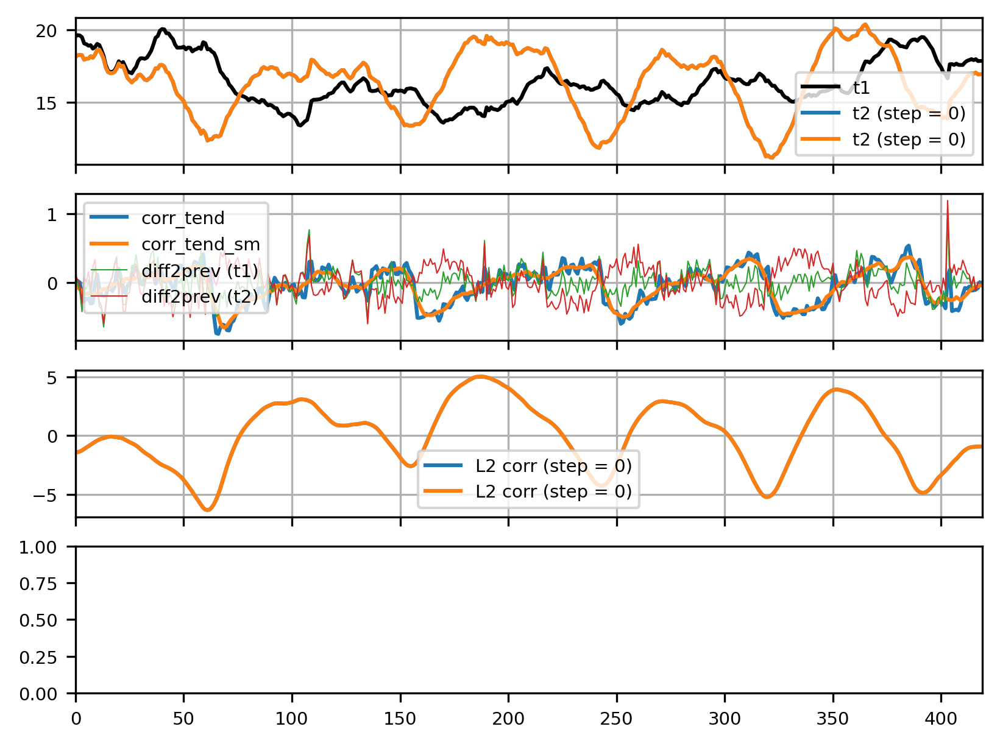

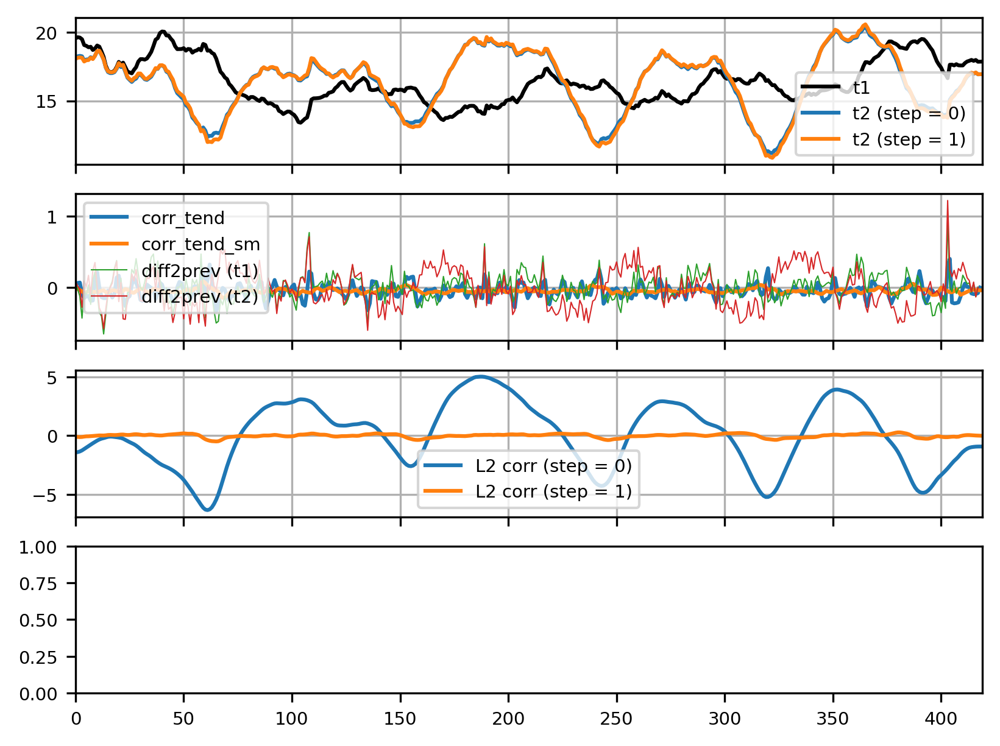

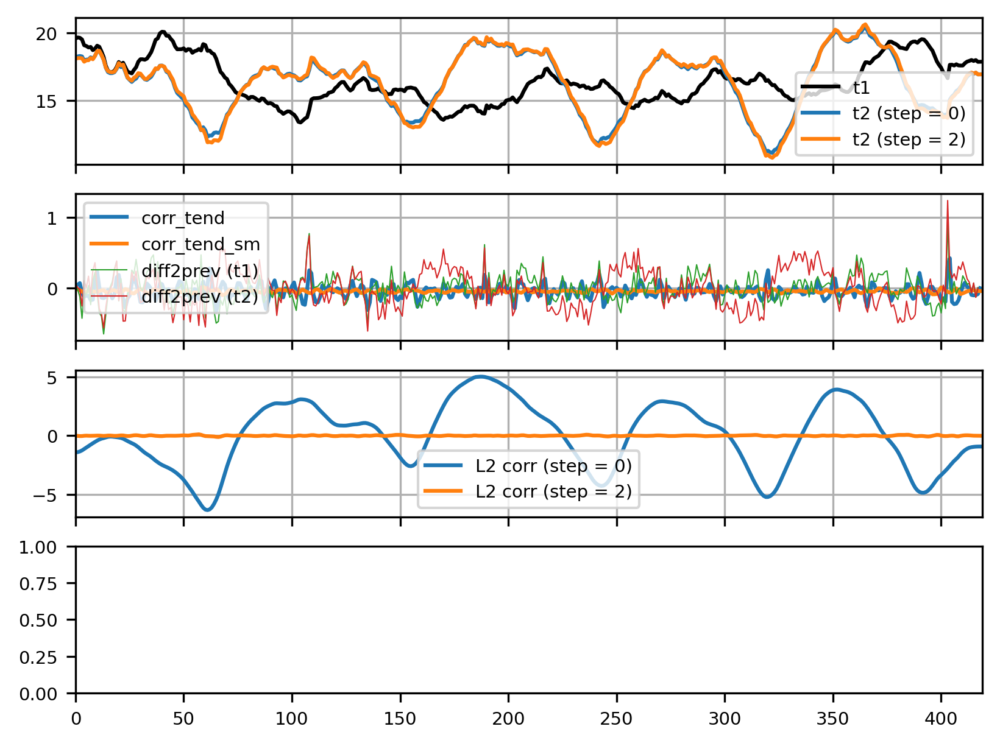

In [7]:
img_array['t2'], diff_matrix['t2'] = IR_corrections.run_L2_corr (img_array['t1'], diff_matrix['t1'],
                                                                 corr_opts['detrend'], corr_opts['L2_nsteps'], corr_opts['L2_wnd'], 1, pics_dir = save_dir)




100%|██████████| 419/419 [00:00<00:00, 4560.59it/s]


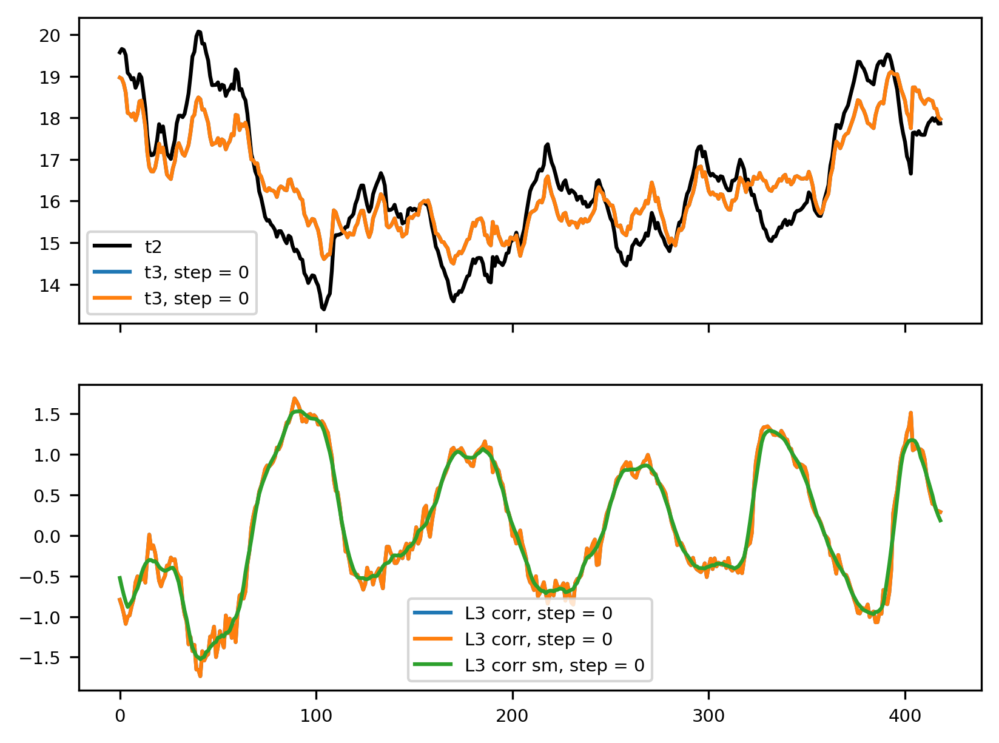

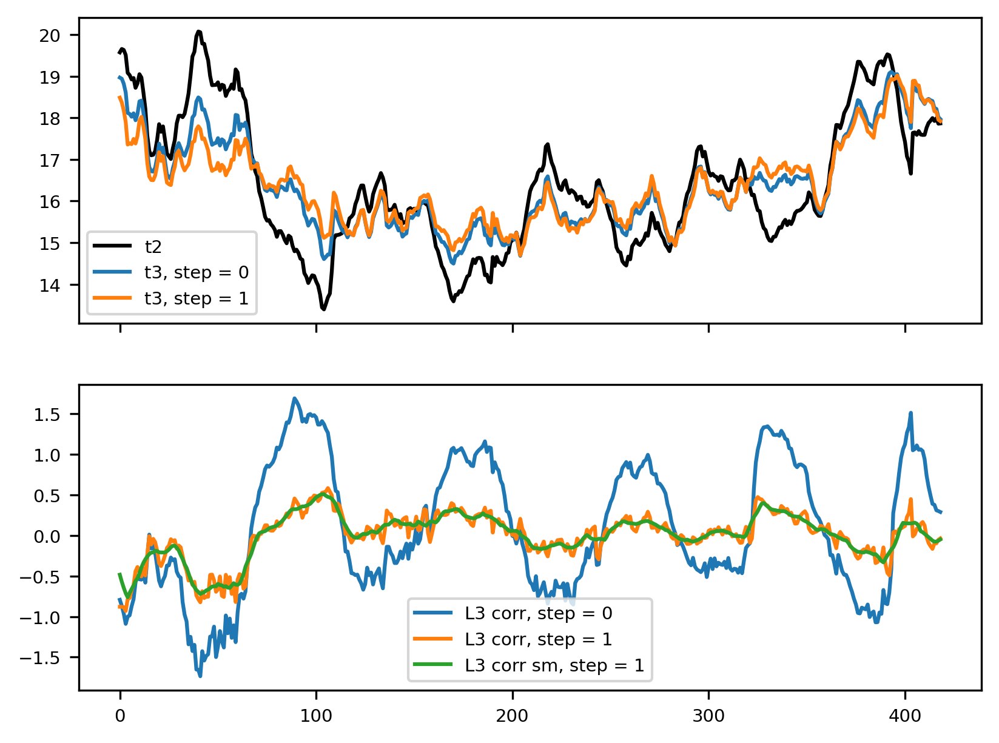

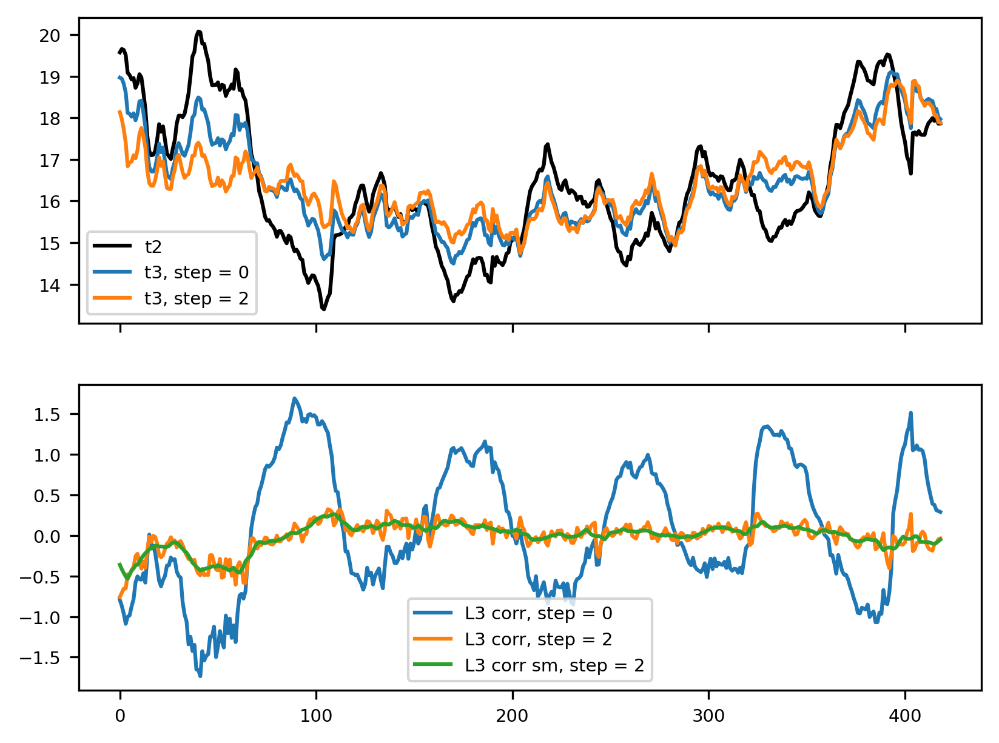

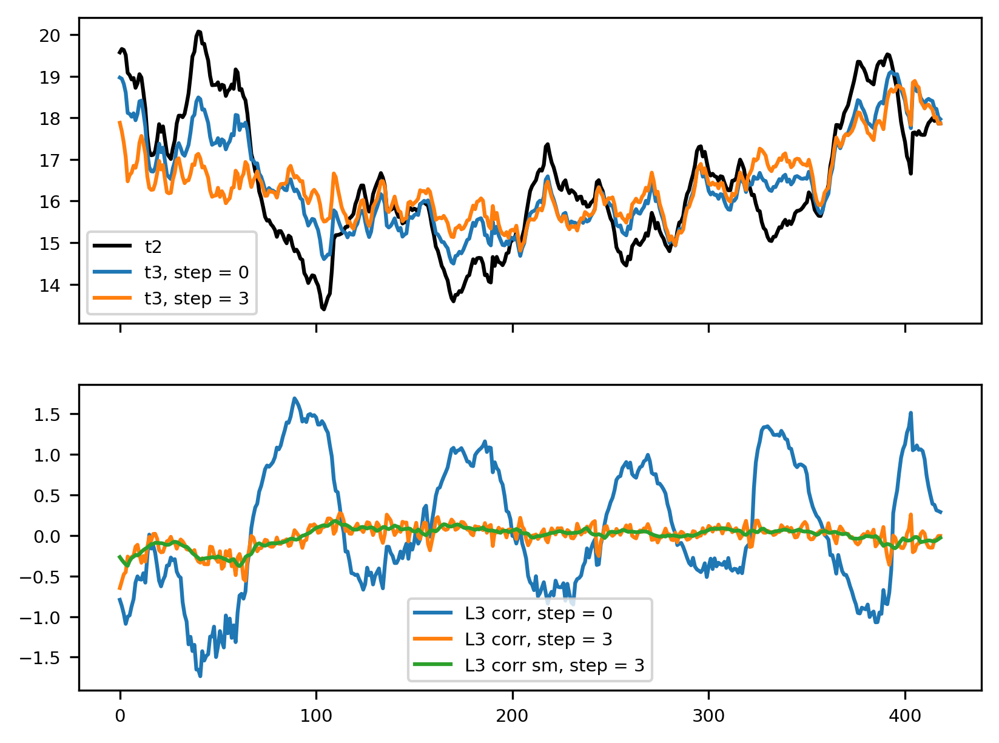

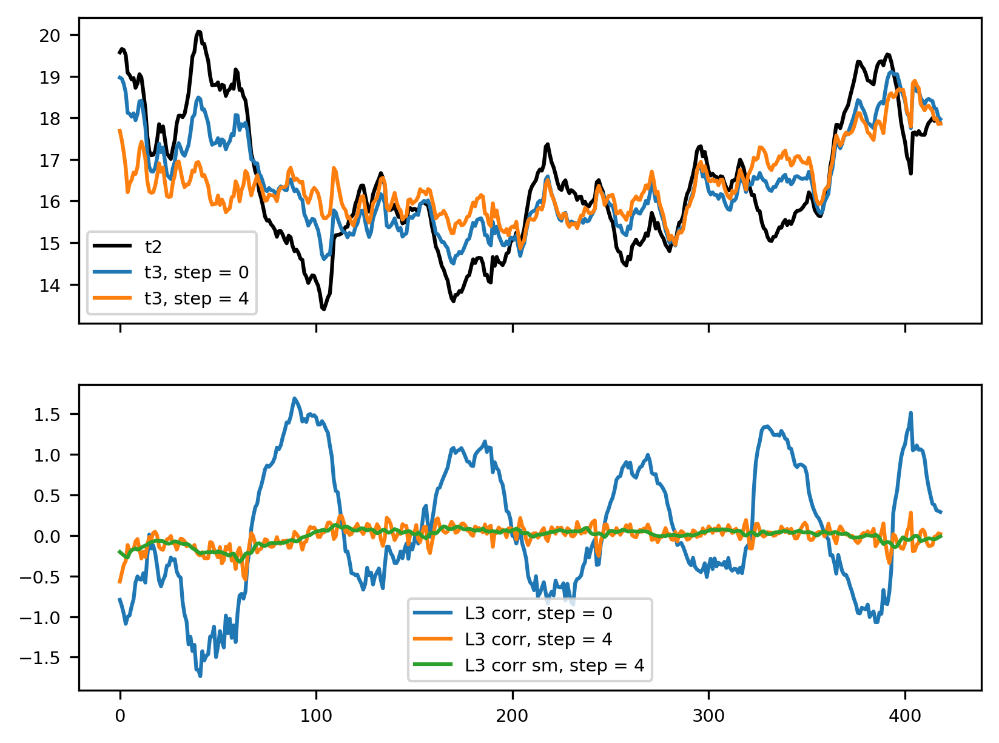

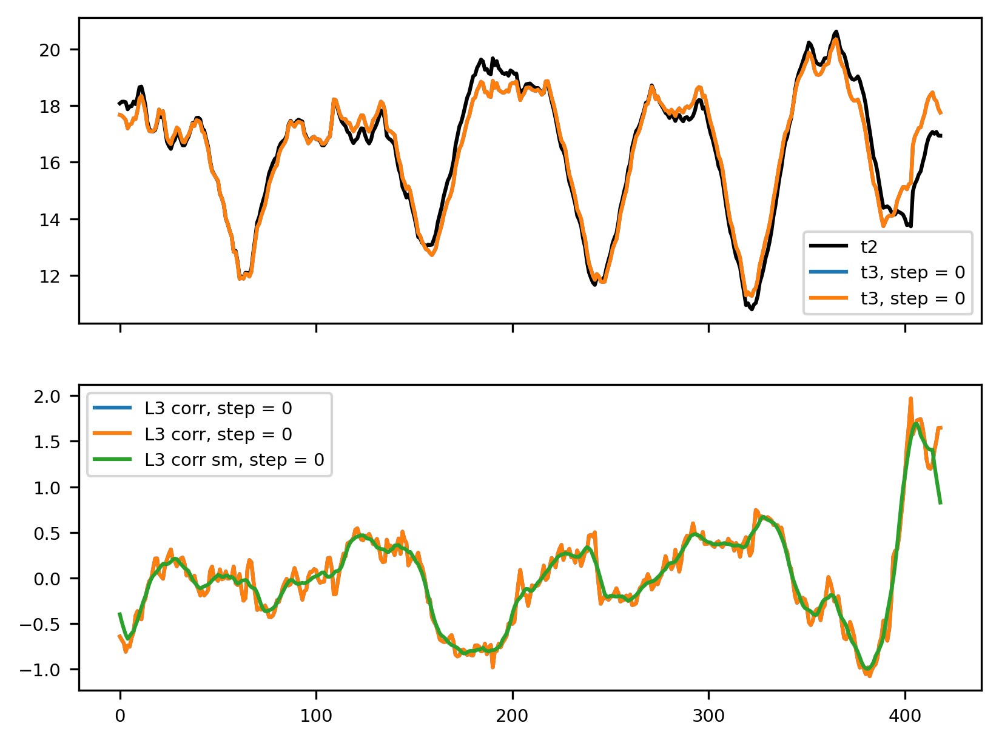

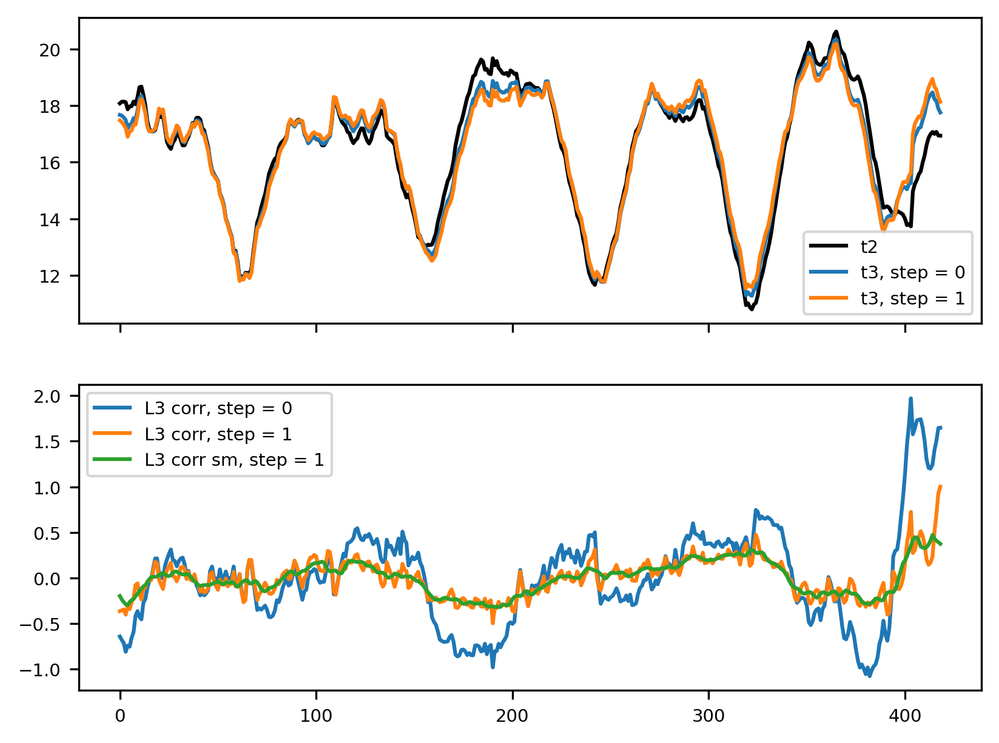

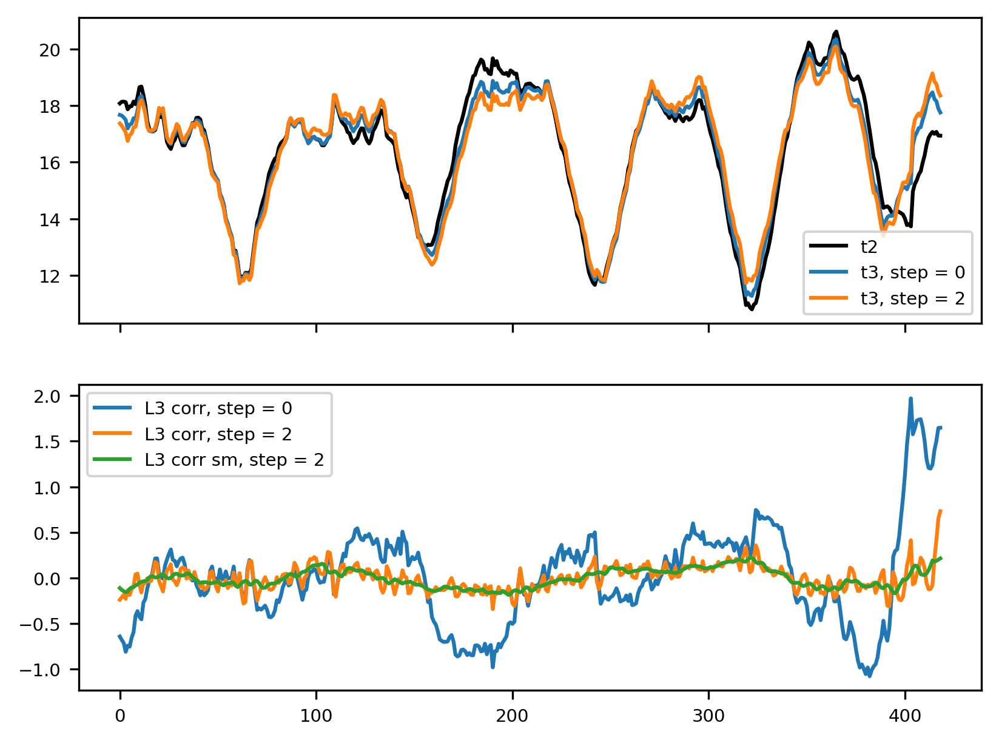

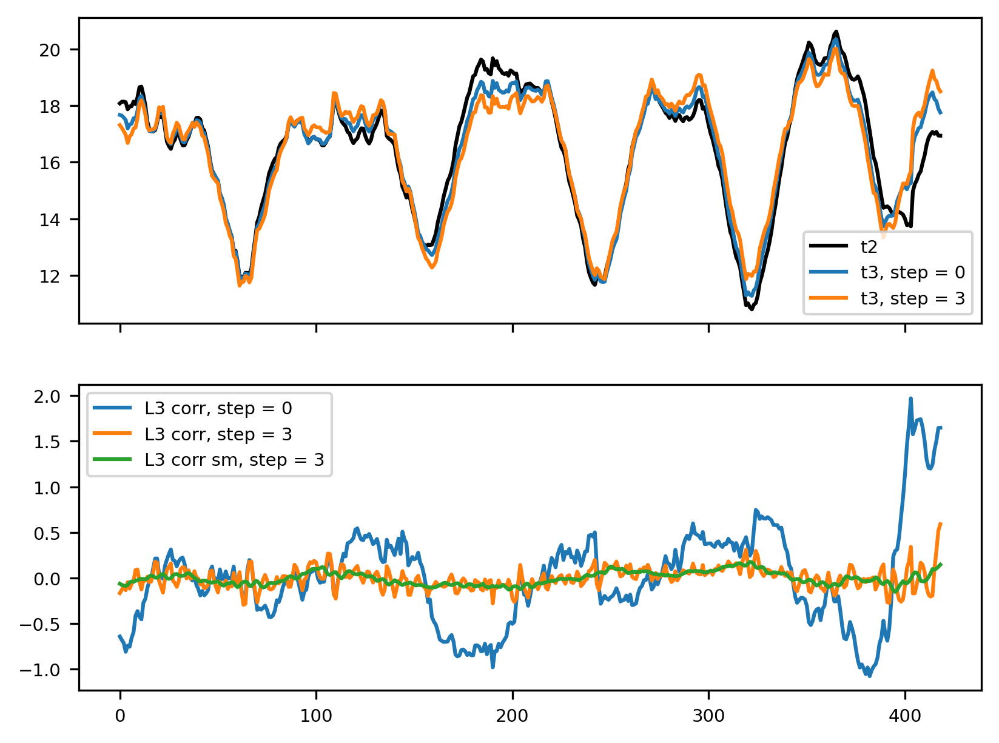

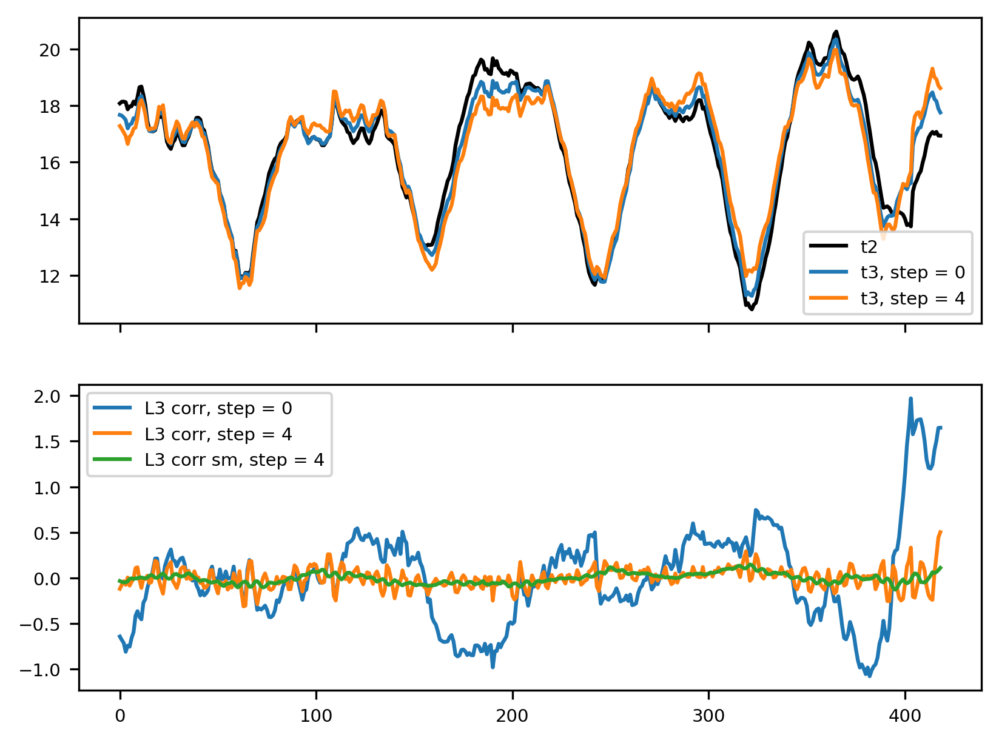

In [8]:
img_array['t31'], diff_matrix['t31'] = IR_corrections.run_L3_corr (img_array['t1'], img_df, diff_matrix['t1'], diff_weights,
                                                                   corr_opts['detrend'], corr_opts['L3_nsteps'], corr_opts['L3_wnd'], pics_dir = save_dir, fig_name = 'L31_corr')

img_array['t32'], diff_matrix['t32'] = IR_corrections.run_L3_corr (img_array['t2'], img_df, diff_matrix['t2'], diff_weights,
                                                                   corr_opts['detrend'], corr_opts['L3_nsteps'], corr_opts['L3_wnd'], pics_dir = save_dir, fig_name = 'L32_corr')




No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


identify_swaths4df(): segment 0 reached 20

identify_swaths4df(): segment 1 reached -49

identify_swaths4df(): segment 2 reached 49

identify_swaths4df(): segment 3 reached -46

identify_swaths4df(): segment 4 reached 46

identify_swaths4df(): segment 5 reached -42

identify_swaths4df(): segment 6 reached 42

identify_swaths4df(): segment 7 reached -39

identify_swaths4df(): segment 8 reached 39

identify_swaths4df(): segment 9 reached -33



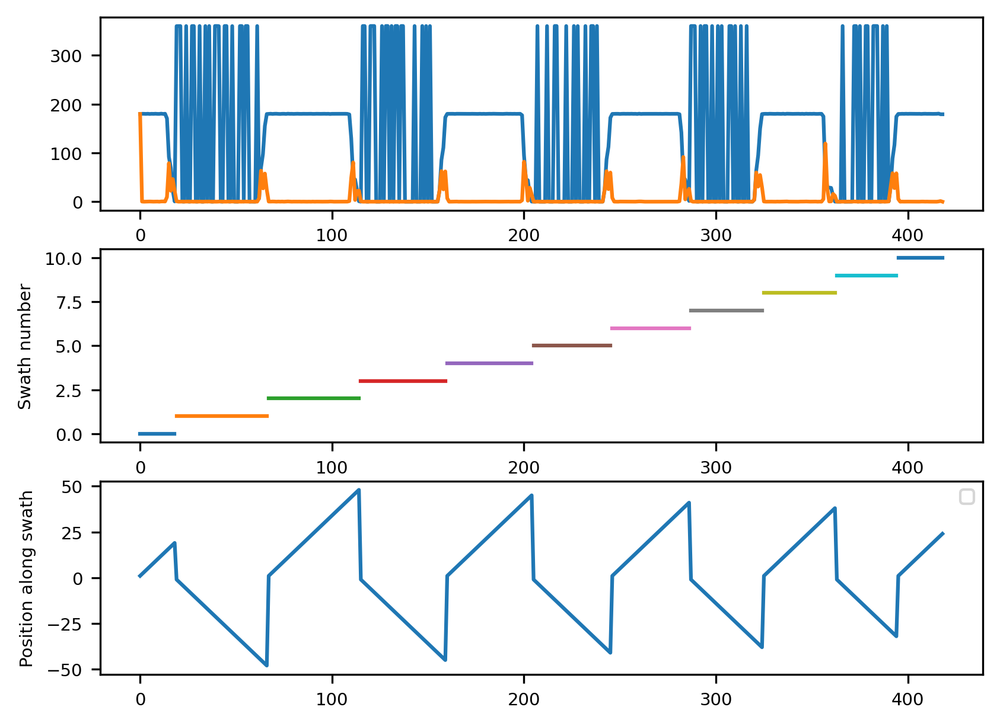

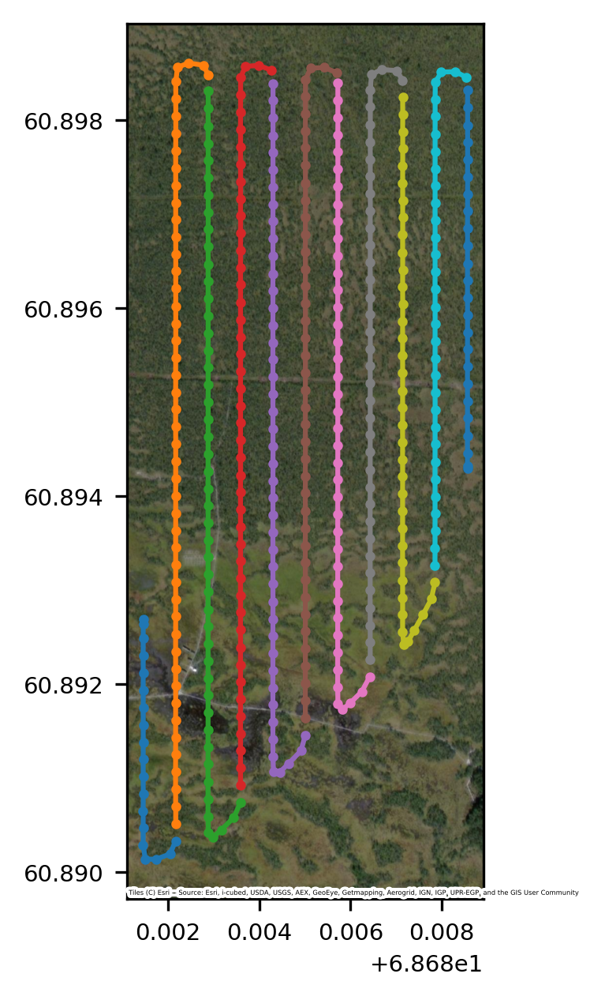

In [9]:
img_df = IR_processing_utils.identify_swaths4df(img_df)
    
f, ax = plt.subplots (3,1)
x = img_df.index.to_numpy()

ax[0].plot (x, img_df['gps_azimuth'], label = 'azimuth')
ax[0].plot (x, img_df['delta_az'], label = 'change of azimuth')
plt.legend()

unique_ids = np.unique(img_df['swath_id'])
for id in unique_ids:
    ax[1].plot (x[img_df['swath_id'] == id], img_df['swath_id'][img_df['swath_id'] == id])
ax[1].set_ylabel ('Swath number')

ax[2].plot (x, img_df['swath_pos'])
ax[2].set_ylabel ('Position along swath')

plt.figure()
for id in unique_ids:
    idx = np.where(img_df['swath_id'] == id)[0]
    plt.plot (img_df['gps_lon'][idx], img_df['gps_lat'][idx], '-o', markersize=2)

cx.add_basemap(plt.gca(), source = cx.providers.Esri.WorldImagery, crs = 4326, attribution_size = 2)    
plt.gca().set_aspect(1.0/np.cos(img_df['gps_lat'].mean()*np.pi/180))

c:\Anaconda\envs\GIS\Lib\site-packages\lowess\lowess.py:70: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '16.014958905787555' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  ySmooth[index] = wLstSqReg(x[points], y[points], polynomialDegree,
c:\Anaconda\envs\GIS\Lib\site-packages\lowess\lowess.py:70: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '16.931203690915822' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  ySmooth[index] = wLstSqReg(x[points], y[points], polynomialDegree,
100%|██████████| 419/419 [00:00<00:00, 4204.13it/s]


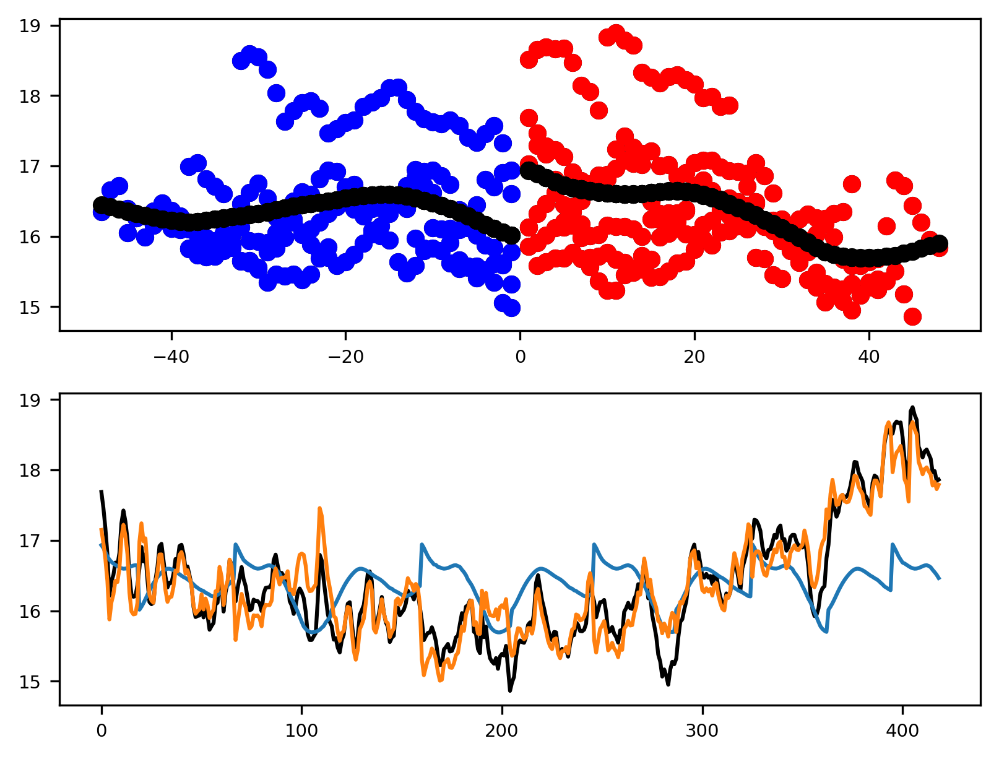

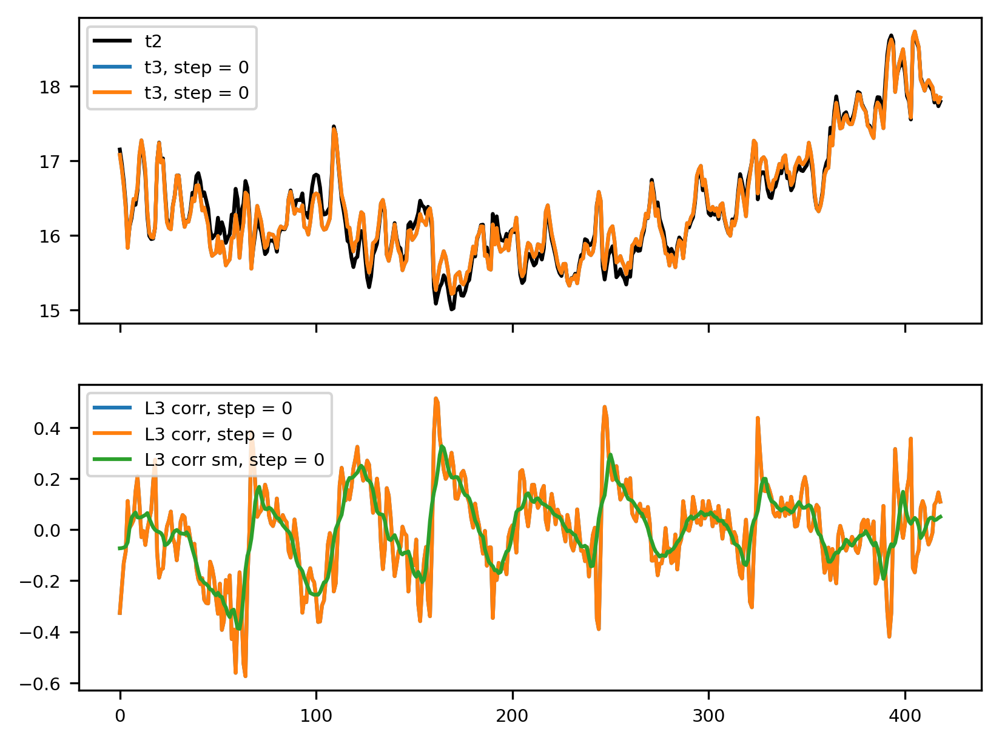

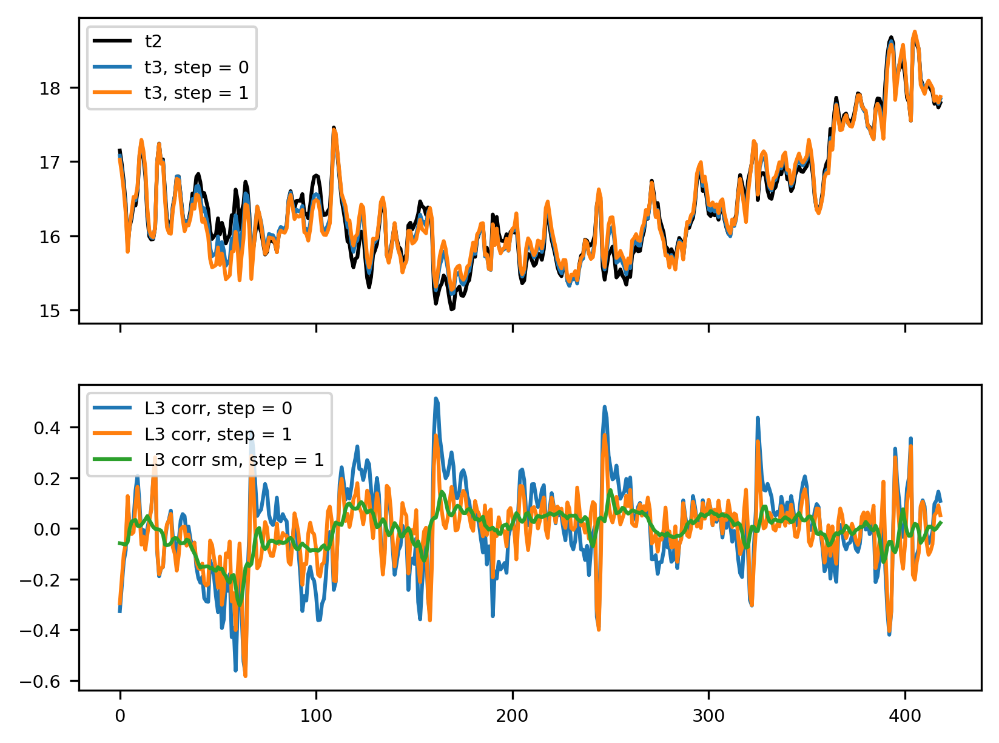

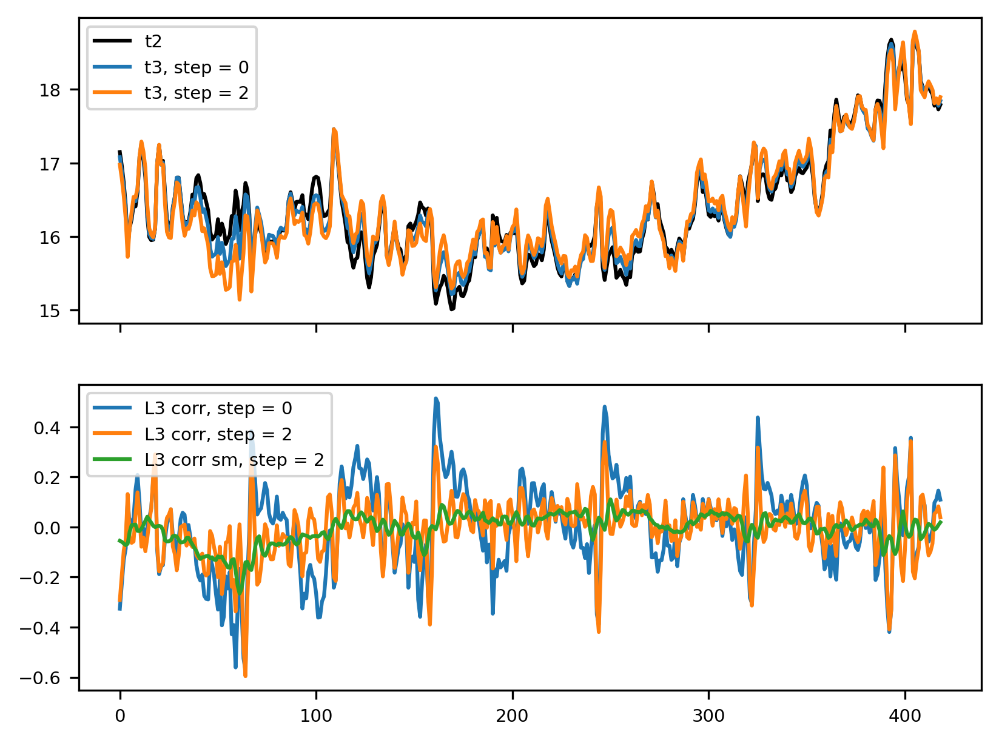

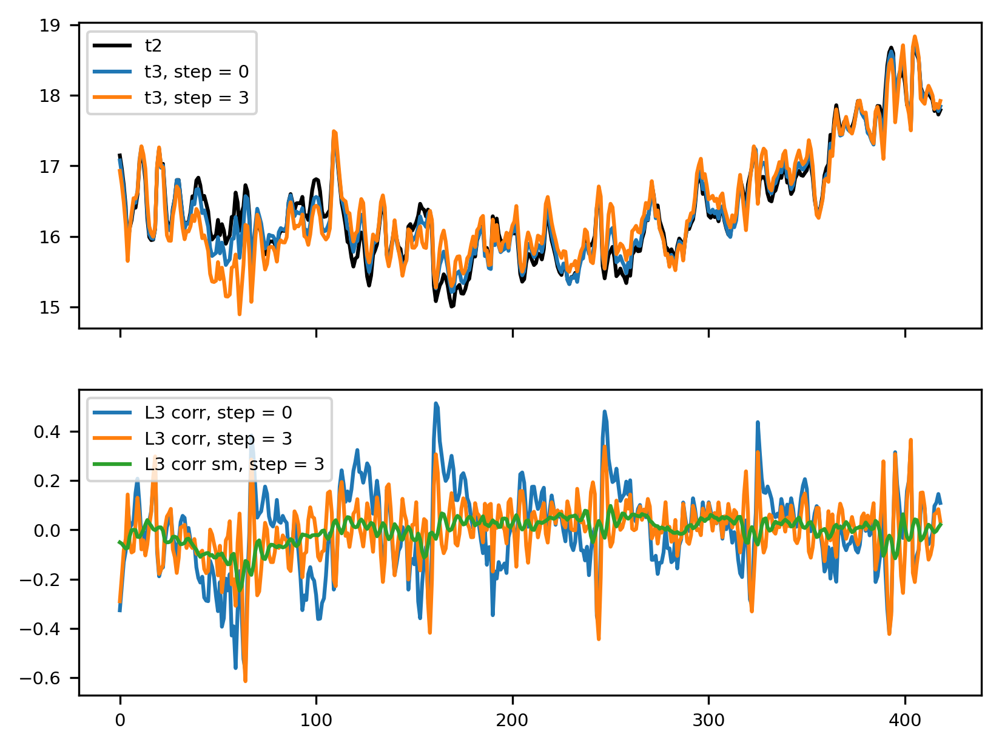

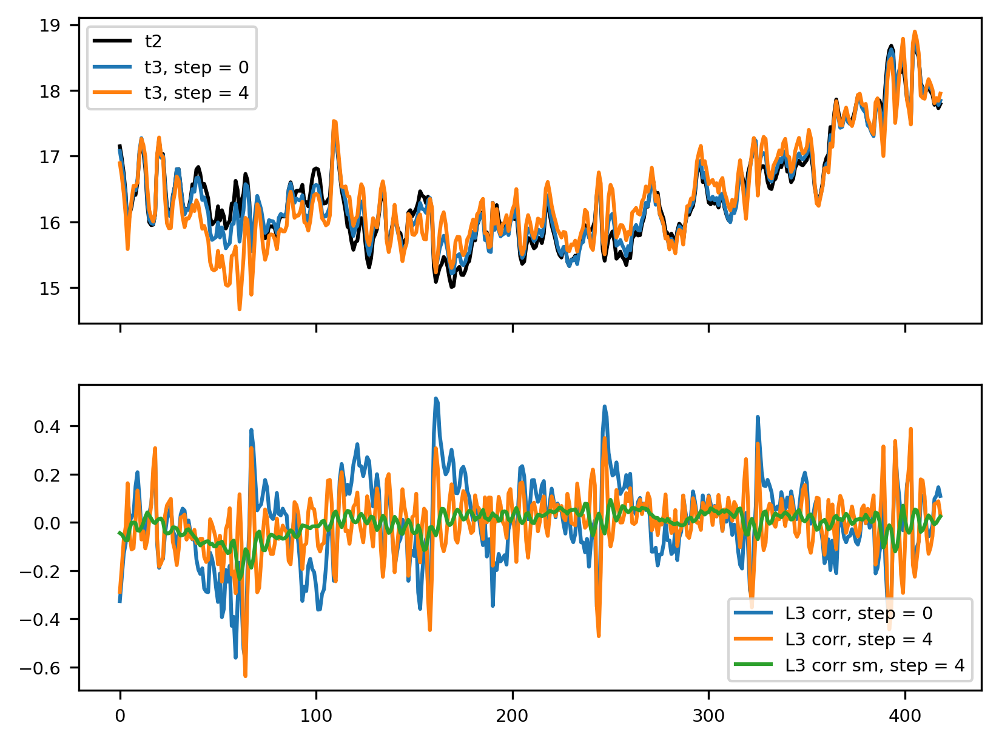

In [10]:
img_array['t431'], diff_matrix['t431'] = IR_corrections.run_L4_corr (img_array['t31'], img_df, diff_matrix['t31'], 
                                                                     pics_dir = save_dir)

img_array['t3431'], diff_matrix['t3431'] = IR_corrections.run_L3_corr (img_array['t431'], img_df, diff_matrix['t431'], diff_weights,
                                                                       corr_opts['detrend'], 1, corr_opts['L3_wnd'], pics_dir = save_dir, fig_name = 'L3431_corr')



SystemExit: 

c:\Anaconda\envs\GIS\Lib\site-packages\IPython\core\interactiveshell.py:3585: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


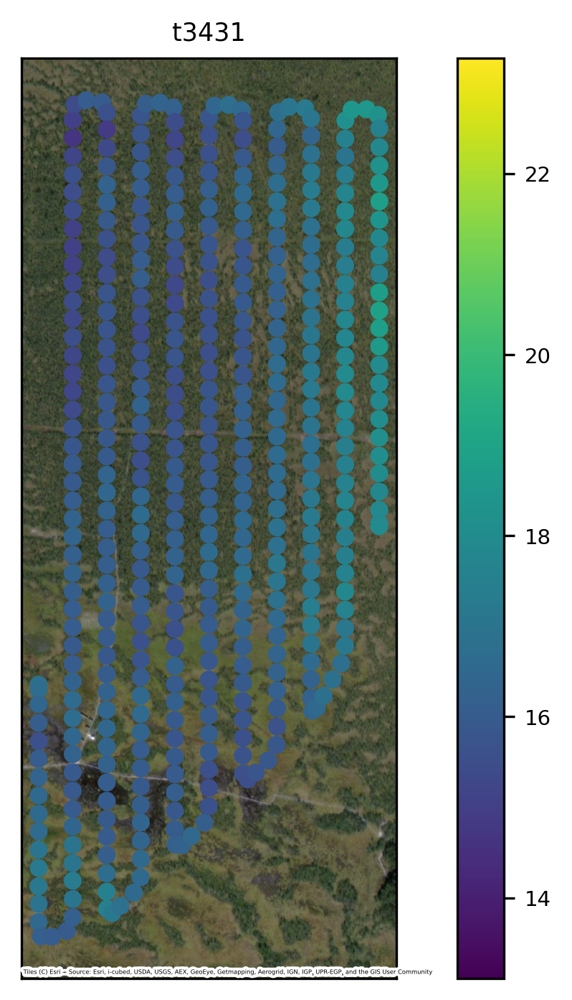

In [11]:
mean_t0 = np.mean(np.mean(img_array['raw'], axis=0), axis=0)

plt.figure()
    
for key in img_array.keys():
    plt.clf()
    mean_t = np.mean(np.mean(img_array[key], axis=0), axis=0)
    im = plt.scatter(img_df['gps_lon'], img_df['gps_lat'], 25, mean_t, vmin = mean_t0.min(), vmax = mean_t0.max())
    cx.add_basemap(plt.gca(), source = cx.providers.Esri.WorldImagery, crs = 4326, attribution_size = 2)    
    plt.gca().set_xticks([])
    plt.gca().set_yticks([])
    plt.gca().set_aspect(1.0/np.cos(img_df['gps_lat'].mean()*np.pi/180))
    plt.title (key)
    plt.subplots_adjust(left=0.01, bottom=0.01, right=0.9, top=0.9, wspace=0.01, hspace=0.1)
    plt.colorbar()

    plt.savefig(save_dir + 'map_' + key + ', detrend=' + str (corr_opts['detrend']) + '.png')

    
sys.exit()


C:\Users\mvar9\AppData\Local\Temp\ipykernel_7132\337607002.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  img_df['swath_pos'] = swath_pos
C:\Users\mvar9\AppData\Local\Temp\ipykernel_7132\337607002.py:13: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  img_df['mean_t31'] = mean_t31
c:\Anaconda\envs\GIS\Lib\site-packages\lowess\lowess.py:70: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '16.014958905787555' has dtype incompatible with float32, pl

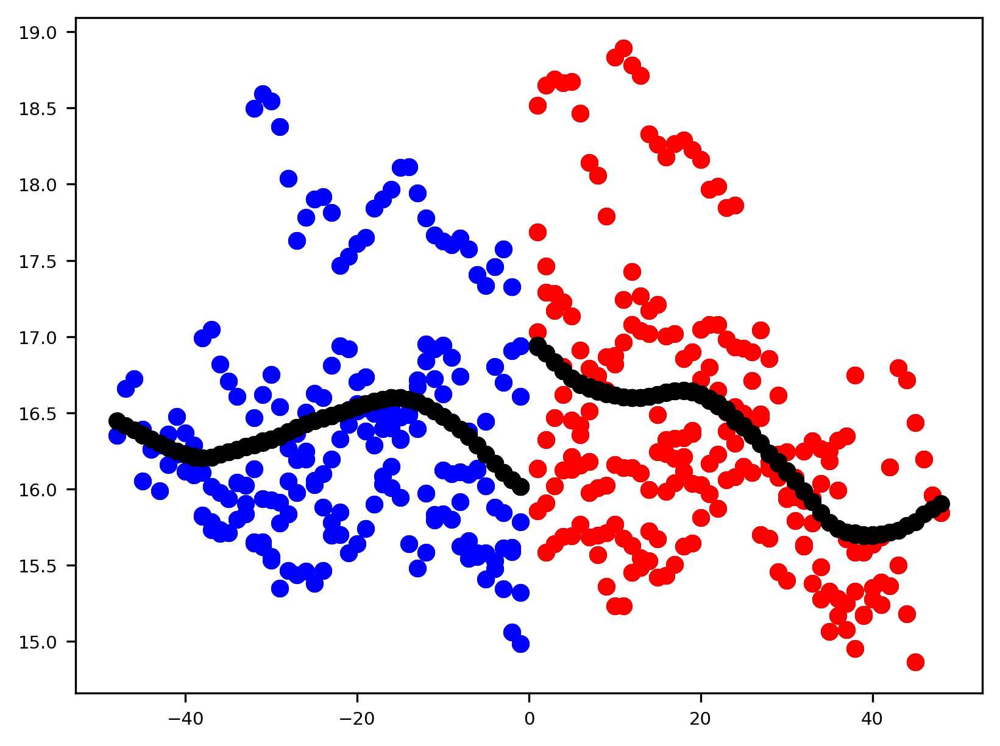

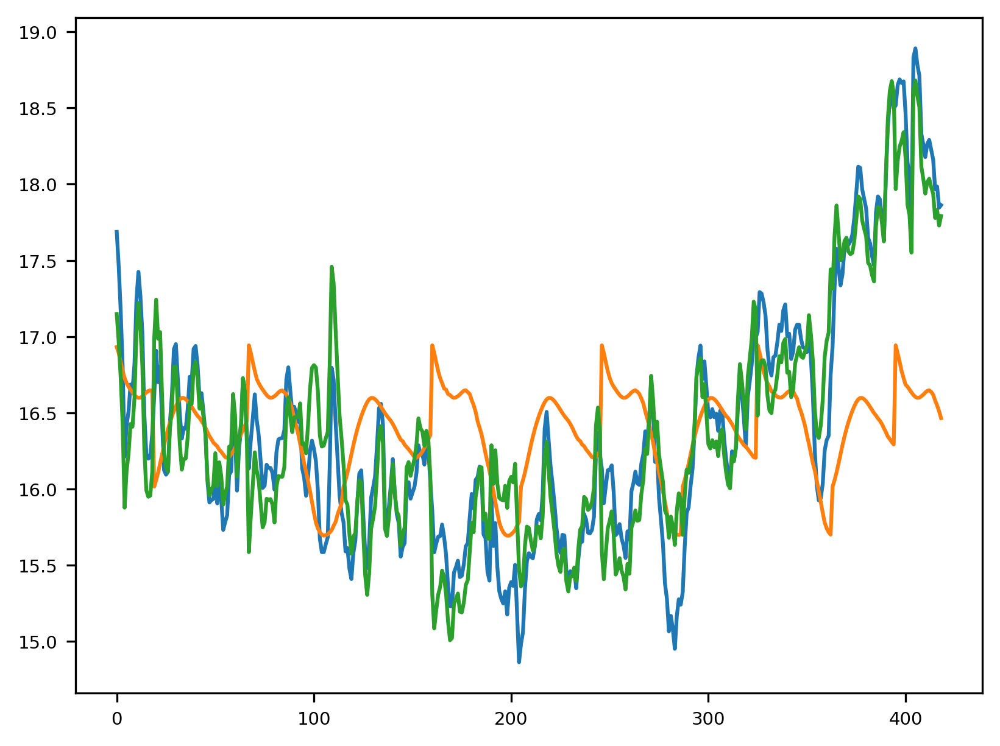

In [ ]:




# import lowess

# mean_t31 = np.mean(np.mean(img_array['t31'], axis=0), axis=0)
# plt.plot(swath_pos, mean_t31, 'ok')

# idx_neg = np.where(swath_pos < 0)[0]
# idx_pos = np.where(swath_pos > 0)[0]

# plt.plot(swath_pos[idx_neg], mean_t31[idx_neg], 'ob')
# plt.plot(swath_pos[idx_pos], mean_t31[idx_pos], 'or')

# img_df['swath_pos'] = swath_pos 
# img_df['mean_t31'] = mean_t31

# #xout, yout, wout = l.loess_1d(swath_pos[idx_neg], mean_t31[idx_neg])
# y_sm = np.zeros_like(mean_t31)
# y_sm[idx_neg] = lowess.lowess(img_df['swath_pos'] [idx_neg], img_df['mean_t31'][idx_neg], bandwidth=0.5)
# y_sm[idx_pos] = lowess.lowess(img_df['swath_pos'] [idx_pos], img_df['mean_t31'][idx_pos], bandwidth=0.5)

# plt.plot(swath_pos[idx_neg], y_sm[idx_neg], 'ok')
# plt.plot(swath_pos[idx_pos], y_sm[idx_pos], 'ok')

# plt.figure()
# plt.plot(mean_t31)
# plt.plot(y_sm)


# corr = y_sm - np.mean(y_sm)

# img_array['t431'] = IR_processing_utils.apply_corr2array(img_array['t31'], -corr)

# mean_t431 = np.mean(np.mean(img_array['t431'], axis=0), axis=0)
# plt.plot(mean_t431)


#plt.figure()
#plt.plot(r)
#sys.exit()

In [ ]:
for key in img_array.keys():
    if key == 'raw':
        continue
    if key != 't3':
        continue

    if data_subdir is None:
        out_dir = data_dir + '\\' + key + 'dt' if corr_opts['detrend'] else 'nodt'
    else:
        out_dir = data_dir + '\\' + data_subdir + ', ' + key + 'dt' if corr_opts['detrend'] else 'nodt'

    if not os.path.isdir(out_dir):
        os.mkdir(out_dir)

    IR_processing_utils.write_IR_images (img_array[key], img_df, out_dir, data_dir_src, n_jobs = 8)

sys.exit()

100%|██████████| 524/524 [01:16<00:00,  6.84it/s]


SystemExit: 

c:\Anaconda\envs\GIS\Lib\site-packages\IPython\core\interactiveshell.py:3585: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


100%|██████████| 419/419 [00:00<00:00, 83802.08it/s]


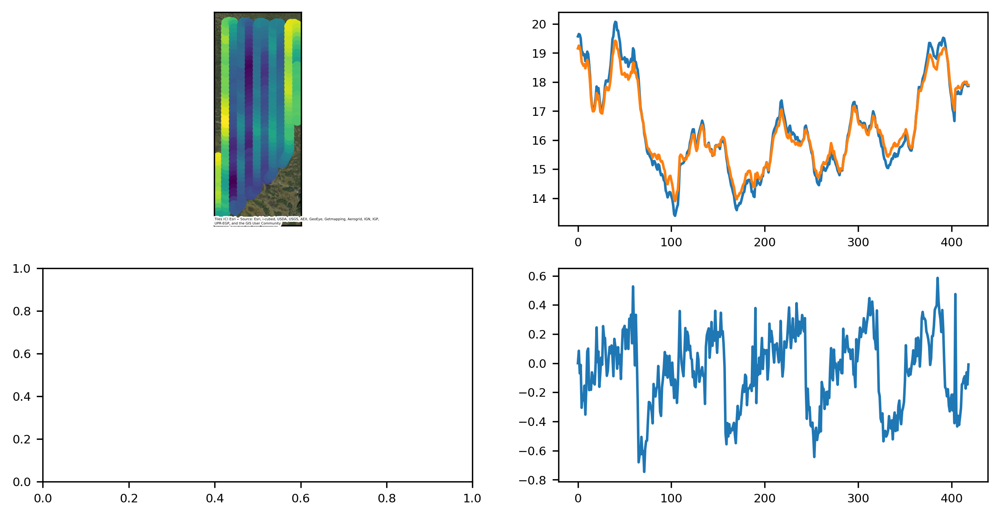

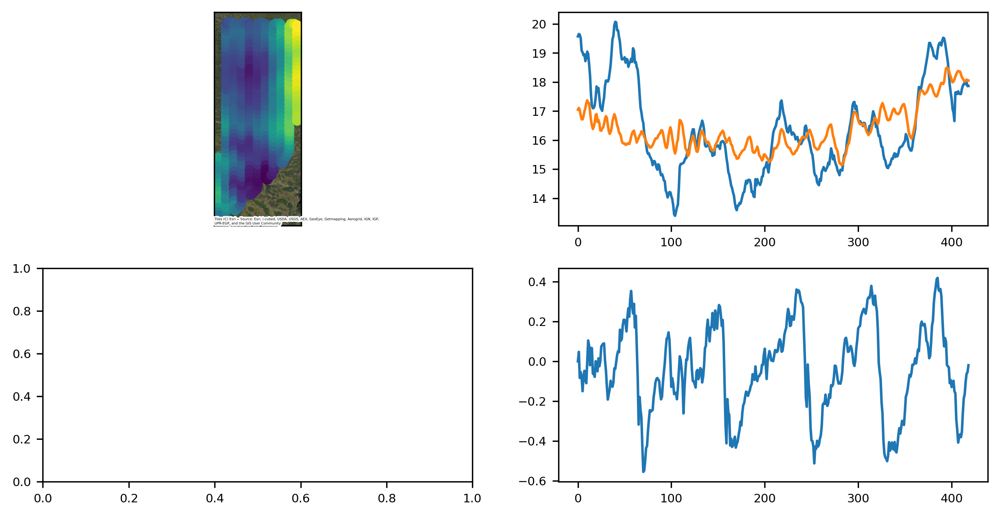

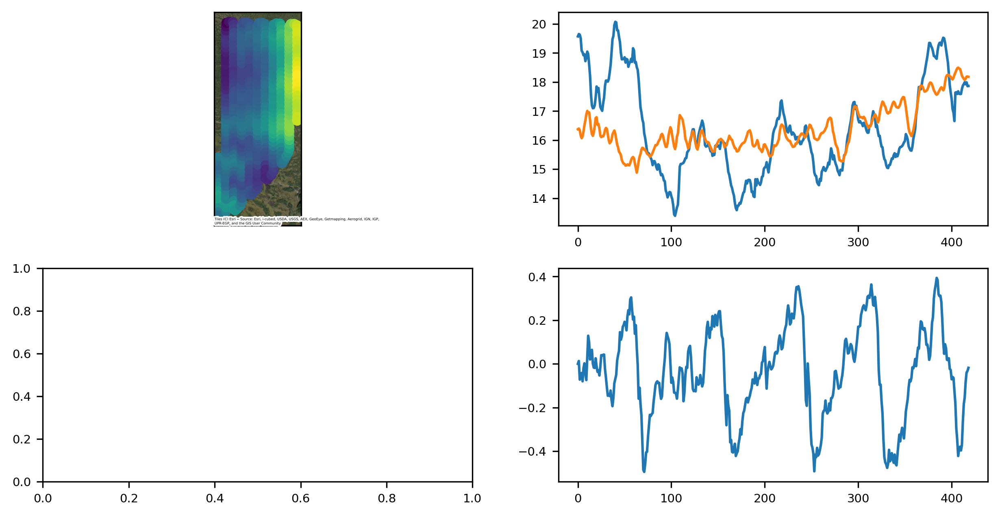

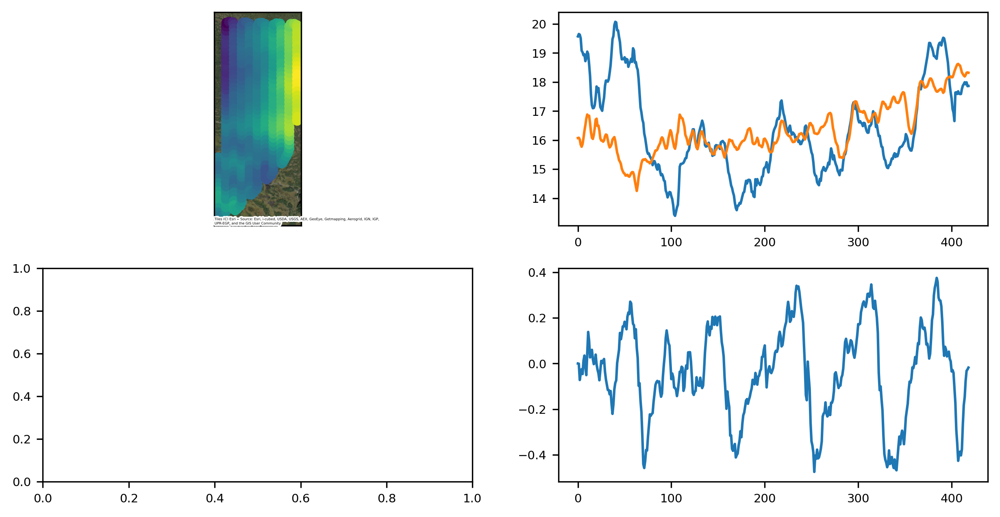

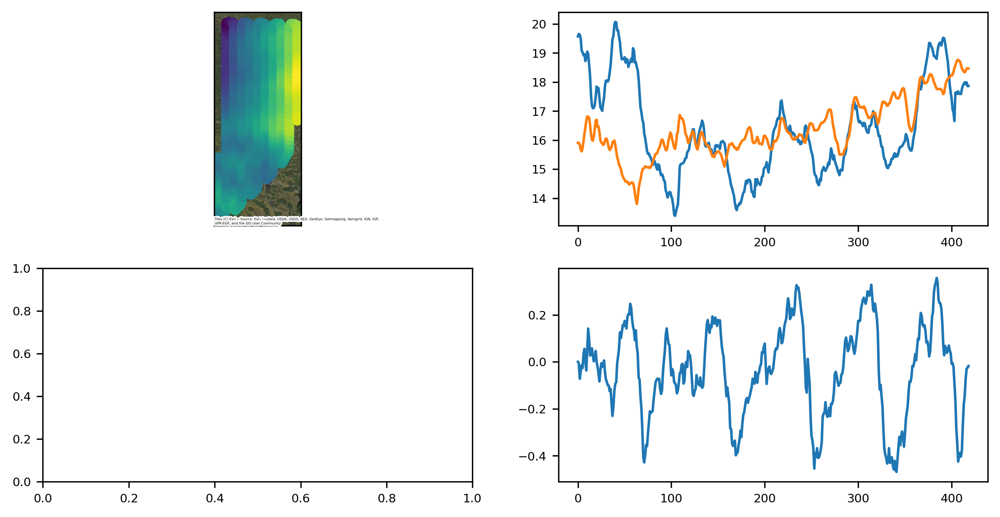

In [ ]:
save_dir = pics_dir + '/corr/'
if not os.path.isdir (save_dir):
    os.mkdir (save_dir)

mean_t0 = np.mean(np.mean(img_array['t1'], axis=0), axis=0)

for step in range (0, 50):

    src_key = 't1' if step == 0 else 't4'

    L4_corr = np.zeros_like(img_df['gps_lon'])

    for i in tqdm (range (0, img_df.shape[0])):

        diff_line = diff_matrix[src_key][i, :]
        weight_line = diff_weights[i, :]

        ind2sel = np.where(~np.isnan(diff_line))[0]

        #L3_corr[i] = -np.mean(diff_line[ind2sel_az])/2
        L4_corr[i] = -0.25 * np.sum(diff_line[ind2sel] * weight_line[ind2sel]) / np.sum(weight_line[ind2sel])

    img_array['t4'] = IR_processing_utils.apply_corr2array(img_array[src_key], L4_corr)
    diff_matrix['t4'] =  IR_processing_utils.apply_corr2diff_matrix(diff_matrix[src_key], L4_corr)

    if np.mod (step, 10) == 0:
        tend2prev = np.array([diff_matrix['t4'][i, i-1] if i > 0 else 0 for i in range (0, img_N)])
        mean_t4 = np.mean(np.mean(img_array['t4'], axis=0), axis=0)

        
        fig, ax = plt.subplots(2,2, figsize = (10, 5))

        ax = ax.flatten()
        ax[0].scatter(img_df['gps_lon'], img_df['gps_lat'], 25, mean_t4)


        cx.add_basemap(ax[0], source = cx.providers.Esri.WorldImagery, crs = 4326, attribution_size = 2)    
        ax[0].set_xticks([])
        ax[0].set_yticks([])
        ax[0].set_aspect(1.0/np.cos(img_df['gps_lat'].mean()*np.pi/180))
        
        ax[1].plot(mean_t0)
        ax[1].plot(mean_t4)

        ax[3].plot (tend2prev)
        
        plt.savefig(save_dir + 'L4_corr, detrend=' + str (corr_opts['detrend']) + '_step' + str(step) + '.png')
    #break



